In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Ερώτημα 1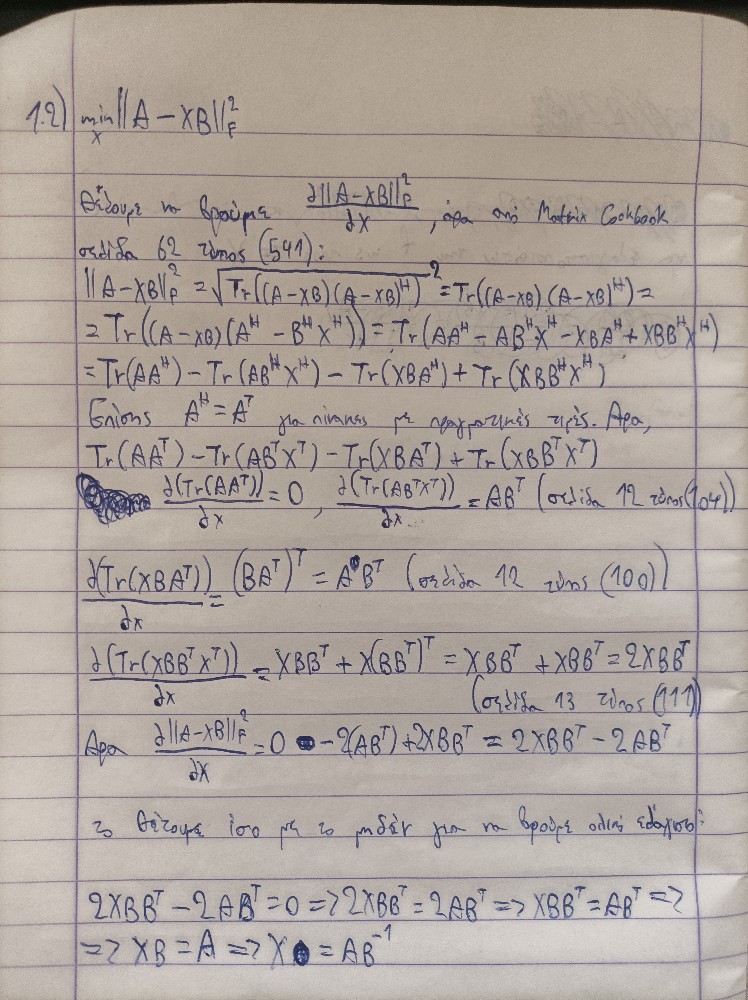: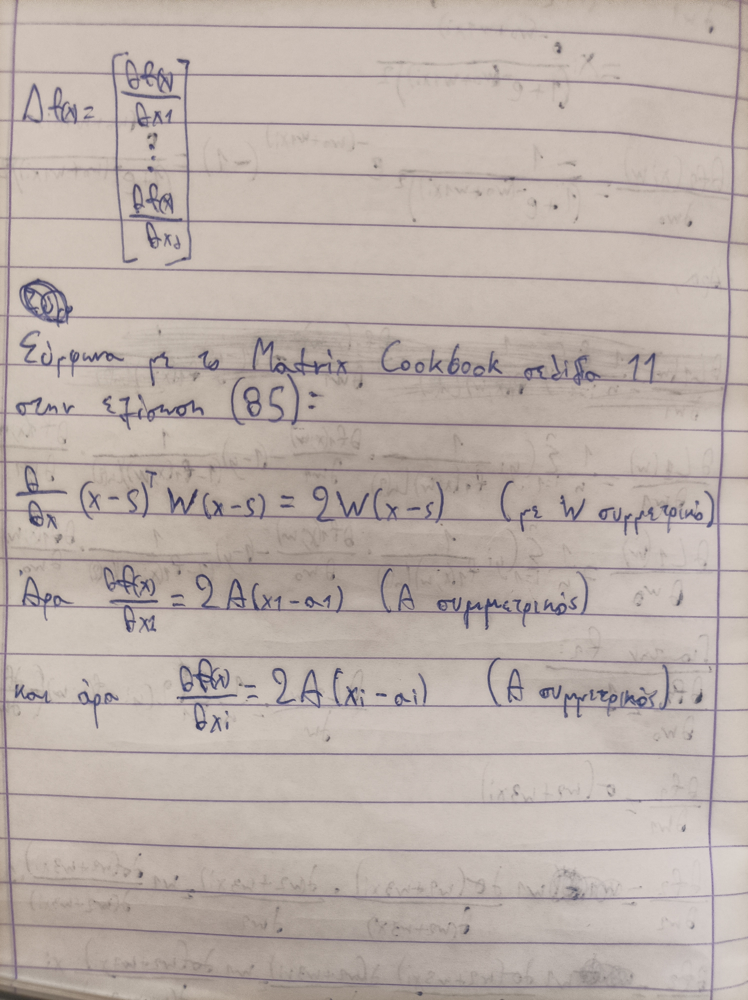

Ερώτημα 2:

Παραθέτω τις παραγώγους παρακάτω:

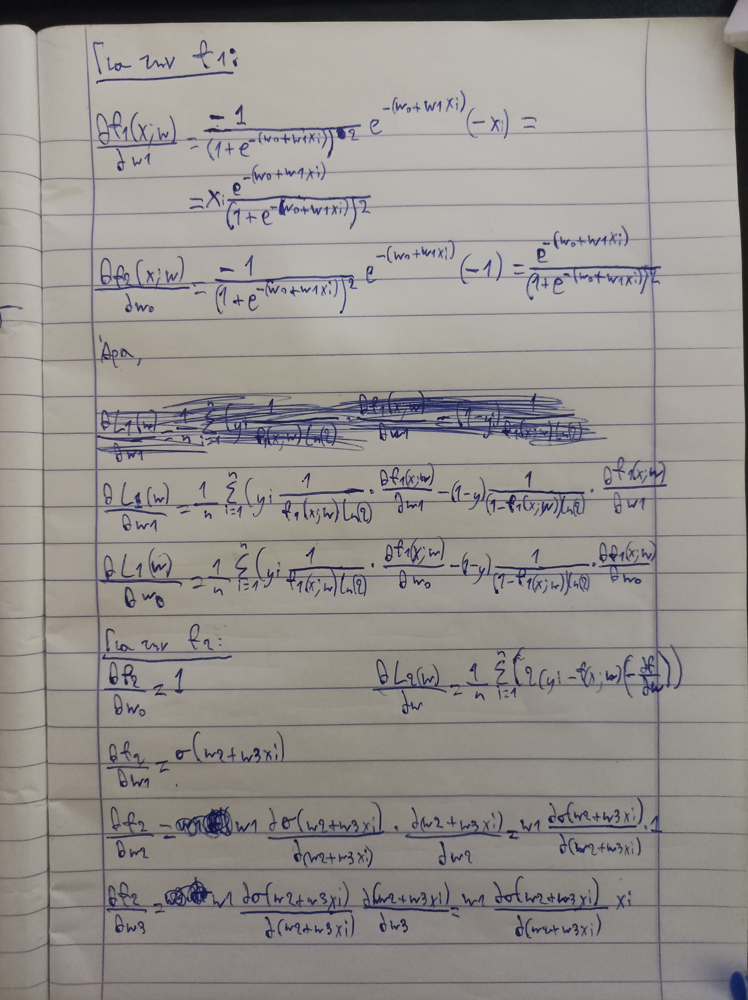

Υποερώτημα 2.1

Στις 150 επαναλήψεις με learning rate = 0.001 όσον αφορά το πόσο καλά προσεγγίζουν οι συναρτήσεις τα δεδομένα, τα προσεγγίζουν πολύ καλά και στην f1 και στην f2 και αυτό φαίνεται στο δεύτερο γράφημα. Το κόστος στην f1 μειώνεται γραμμικά, ενώ στην f2 μειώνεται εκθετικά και από ότι φαίνεται ίσως και οι 20 επαναλήψεις περίπου να αρκούσανε για μια καλή προσέγγιση με βάση το κόστος στις 20 επαναλήψεις.
Στις 150 επαναλήψεις με learning rate = 0.0001 στην f1 δεν παρατηρείται μεγάλη εώς καθόλου βελτίωση στο κόστος, και τα δεδομένα προσεγγίζονται το ίδιο καλά. Στην f2 το κόστος μειώνεται λιγότερο εκθετικά από ότι πριν, άρα αυξάνεται το κόστος, και αυτό απεικονίζεται και στην προσέγγιση των δεδομένων, αφού δεν προσεγγίζονται τόσο καλά στο δεύτερο γράφημα.

Η f1:

Iteration 1: Weight  1.0000193170525558, Bias -2.2041505474611036e-07
Iteration 2: Weight  1.0000386326252921, Bias -4.4077227140199027e-07
Iteration 3: Weight  1.0000579467184476, Bias -6.610716611311291e-07
Iteration 4: Weight  1.0000772593322607, Bias -8.813132350941485e-07
Iteration 5: Weight  1.0000965704669698, Bias -1.1014970044487992e-06
Iteration 6: Weight  1.000115880122813, Bias -1.3216229803499694e-06
Iteration 7: Weight  1.0001351883000287, Bias -1.5416911739496777e-06
Iteration 8: Weight  1.000154494998855, Bias -1.7617015963970815e-06
Iteration 9: Weight  1.0001738002195302, Bias -1.9816542588384706e-06
Iteration 10: Weight  1.0001931039622922, Bias -2.2015491724172756e-06
Iteration 11: Weight  1.0002124062273792, Bias -2.4213863482740645e-06
Iteration 12: Weight  1.0002317070150288, Bias -2.6411657975465405e-06
Iteration 13: Weight  1.0002510063254793, Bias -2.8608875313695518e-06
Iteration 14: Weight  1.0002703041589682, Bias -3.0805515608750835e-06
Iteration 15: Weigh

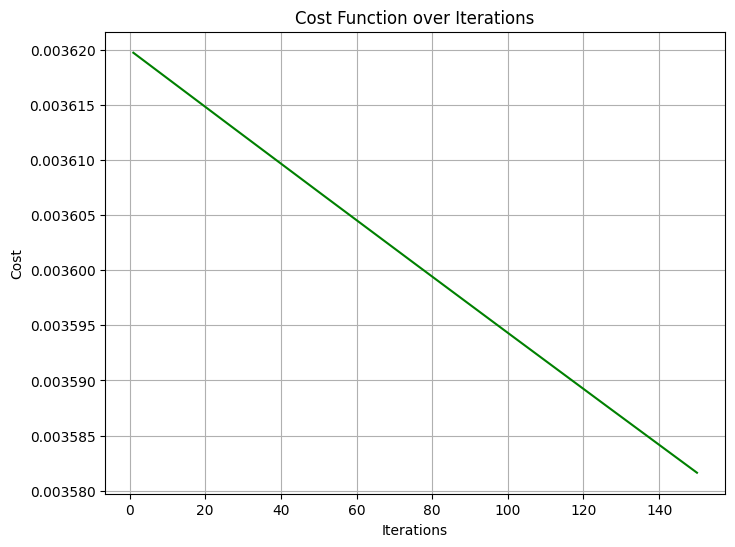

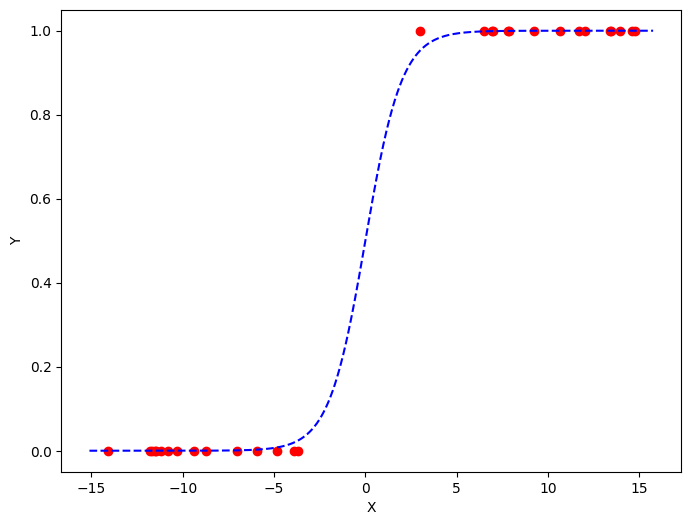

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import math


def f1(xi, w1, w0):
    return 1.0 / (1.0 + np.exp(-(w0 + w1 * xi)))

def f1_w1_derivative(xi, w1, w0):
    numerator = xi * np.exp(-(w0 + w1 * xi))
    denominator = (1 + np.exp(-(w0 + w1 * xi)))**2
    return numerator / denominator

def f1_w0_derivative(xi, w1, w0):
    numerator = np.exp(-(w0 + w1 * xi))
    denominator = (1 + np.exp(-(w0 + w1 * xi)))**2
    return numerator / denominator

def compute_cost_f1(x, y, w0, w1):
    cost = 0
    n = len(x)
    for i in range(n):
        y_predicted = f1(x[i], w1, w0)
        cost += (y[i] * math.log(y_predicted) + (1 - y[i]) * math.log((1 - y_predicted)))
    return -cost / n

def gradient_descent_f1(x, y, iterations, learning_rate):
    w0 = 0.0
    w1 = 1.0
    n = len(x) #num of samples
    cost_values = []

    for t in range(iterations):
        w1_sum = 0
        w0_sum = 0

        for i in range(n):
            y_predicted = f1(x[i], w1, w0)
            f1_w1 = f1_w1_derivative(x[i], w1, w0)
            f1_w0 = f1_w0_derivative(x[i], w1, w0)
            w1_sum += ((y[i]*(1.0 / (y_predicted * math.log(2))) * f1_w1) - ((1 - y[i]) * (1.0 / ((1 - y_predicted) * math.log(2))) * f1_w1))
            w0_sum += ((y[i]*(1.0 / (y_predicted * math.log(2))) * f1_w0) - ((1 - y[i]) * (1.0 / ((1 - y_predicted) * math.log(2))) * f1_w0))

        w1_derivative = - w1_sum / float(n)
        w0_derivative = - w0_sum / float(n)

        # Updating weights and bias
        w1 = w1 - (learning_rate * w1_derivative)
        w0 = w0 - (learning_rate * w0_derivative)
        cost_values.append(compute_cost_f1(X, Y, w0, w1))

        # Printing the parameters for each 1000th iteration
        print(f"Iteration {t+1}: Weight  {w1}, Bias {w0}")

    return w1, w0, cost_values

data1 = np.array([[ 10.63415642, -10.31804897,  -3.91323692,  13.47455445,
         12.00245098,   7.01459213, -11.5083141 ,   7.83875   ,
        -11.21021617,   6.95282804,   7.79101979,  13.94835343,
          3.01243432,  11.67679791,  13.41197807,  14.61995534,
         -8.70743264, -14.10312612, -11.68244994,  14.75202699,
          9.25316629,  -4.82661632,  -6.99915042,   6.49562369,
        -11.46126563,  -9.38897405,  -3.68953244,  -5.95603391,
        -10.80285714, -11.78004227],
       [  1.        ,   0.        ,   0.        ,   1.        ,
          1.        ,   1.        ,   0.        ,   1.        ,
          0.        ,   1.        ,   1.        ,   1.        ,
          1.        ,   1.        ,   1.        ,   1.        ,
          0.        ,   0.        ,   0.        ,   1.        ,
          1.        ,   0.        ,   0.        ,   1.        ,
          0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ]])


X = data1[0]
Y = data1[1]
iterations = 150
learning_rate = 0.001

# Estimating weight and bias using gradient descent
estimated_weight, estimated_bias, costs = gradient_descent_f1(X, Y, iterations, learning_rate)
print(f"Estimated Weight: {estimated_weight}\nEstimated Bias: {estimated_bias}")

# Making predictions using estimated parameters
Y_pred = 1.0 / (1.0 + np.exp(-(estimated_bias + estimated_weight * X)))

# Βρίσκουμε το εύρος των τιμών του X με ένα περιθώριο
x_range = np.linspace(min(X) - 1, max(X) + 1, 1000)

# Υπολογίζουμε τις προβλέψεις για όλο το εύρος του X
Y_pred_range = 1.0 / (1.0 + np.exp(-(estimated_bias + estimated_weight * x_range)))

# Δημιουργία γραφήματος
plt.figure(figsize=(8, 6))
plt.plot(range(1, iterations + 1), costs, color='green')
plt.title('Cost Function over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.grid(True)
plt.show()

# Ζωγραφίζουμε το γράφημα
plt.figure(figsize=(8, 6))
plt.scatter(X, Y, marker='o', color='red')
plt.plot(x_range, Y_pred_range, color='blue', markerfacecolor='red', markersize=10, linestyle='dashed')
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


Η f2:

Iteration 1: Weight3  3.3967725929875625, Weight2  2.198563017942928, Weight1  0.9858654556321543, Bias 0.498102171510024
Iteration 2: Weight3  3.393873602224812, Weight2  2.197258762123494, Weight1  0.9729684615158242, Bias 0.4963205207611695
Iteration 3: Weight3  3.391266667388411, Weight2  2.196072607243077, Weight1  0.961196346610509, Bias 0.49464473512490537
Iteration 4: Weight3  3.3889200143325775, Weight2  2.194991764841159, Weight1  0.9504475181154713, Bias 0.4930654818061054
Iteration 5: Weight3  3.386805794259782, Weight2  2.194005019634062, Weight1  0.9406302266342161, Bias 0.49157430439043326
Iteration 6: Weight3  3.3848995300948075, Weight2  2.193102508499715, Weight1  0.9316614945655642, Bias 0.4901635321348771
Iteration 7: Weight3  3.3831796508232856, Weight2  2.192275534471828, Weight1  0.9234661817855959, Bias 0.48882620011876077
Iteration 8: Weight3  3.3816270983320162, Weight2  2.191516409603243, Weight1  0.9159761675233175, Bias 0.48755597870258893
Iteration 9: Weig

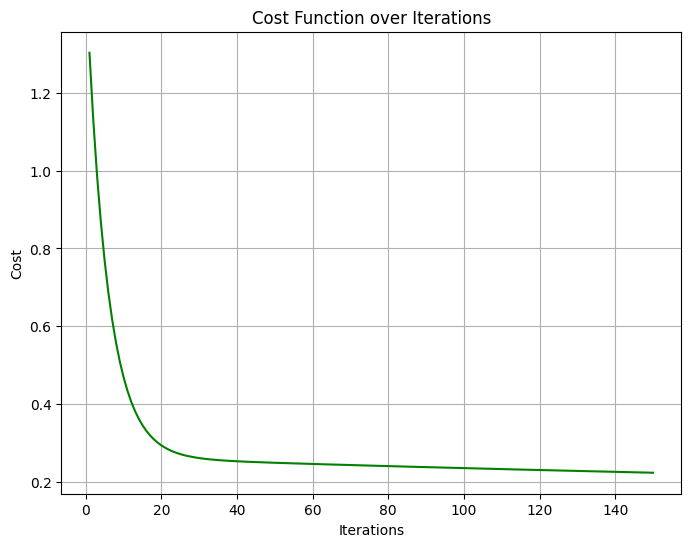

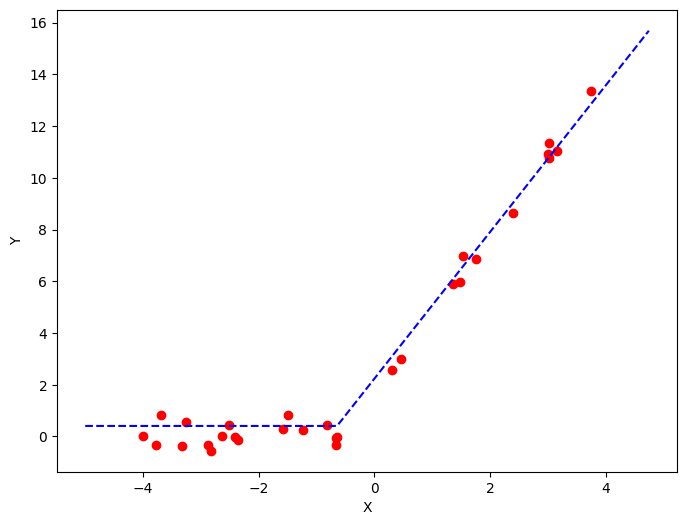

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import math

def s(r):
    if r > 0:
        return r
    else:
        return 0

def f2(xi, w3, w2, w1, w0):
    return w0 + w1*s(w2 + w3*xi)

def ds(r):
    if r > 0:
        return 1
    else:
        return 0

def f2_w3_derivative(xi, w3, w2, w1):
    return w1 * ds(w2 + w3*xi) * xi

def f2_w2_derivative(xi, w3, w2, w1):
    return w1 * ds(w2 + w3*xi)

def f2_w1_derivative(xi, w3, w2):
    return s(w2 + w3*xi)

def f2_w0_derivative():
    return 1

def compute_cost_f2(x, y, w3, w2, w1, w0):
    cost = 0
    n = len(x)
    for i in range(n):
        y_predicted = f2(x[i], w3, w2, w1, w0)
        cost += (y[i] - y_predicted)**2
    return cost / n

def gradient_descent_f2(x, y, iterations, learning_rate):
    w0 = 0.5
    w1 = 1.0
    w2 = 2.2
    w3 = 3.4
    n = len(x) #num of samples
    cost_values = []

    for t in range(iterations):
        w3_sum = 0
        w2_sum = 0
        w1_sum = 0
        w0_sum = 0

        for i in range(n):
            y_predicted = f2(x[i], w3, w2, w1, w0)
            f2_w3 = f2_w3_derivative(x[i], w3, w2, w1)
            f2_w2 = f2_w2_derivative(x[i], w3, w2, w1)
            f2_w1 = f2_w1_derivative(x[i], w3, w2)
            f2_w0 = f2_w0_derivative()

            w3_sum += 2 * (y[i] - y_predicted) * (-f2_w3)
            w2_sum += 2 * (y[i] - y_predicted) * (-f2_w2)
            w1_sum += 2 * (y[i] - y_predicted) * (-f2_w1)
            w0_sum += 2 * (y[i] - y_predicted) * (-f2_w0)

        w3_derivative = w3_sum / float(n)
        w2_derivative = w2_sum / float(n)
        w1_derivative = w1_sum / float(n)
        w0_derivative = w0_sum / float(n)

        # Updating weights and bias
        w3 = w3 - (learning_rate * w3_derivative)
        w2 = w2 - (learning_rate * w2_derivative)
        w1 = w1 - (learning_rate * w1_derivative)
        w0 = w0 - (learning_rate * w0_derivative)
        cost_values.append(compute_cost_f2(X, Y, w3, w2, w1, w0))

        # Printing the parameters for each 1000th iteration
        print(f"Iteration {t+1}: Weight3  {w3}, Weight2  {w2}, Weight1  {w1}, Bias {w0}")

    return w3, w2, w1, w0, cost_values


data2 = np.array([[-6.63823962e-01,  1.76259595e+00, -3.99908500e+00,
        -1.58133942e+00, -2.82595287e+00, -3.26129124e+00,
        -2.50991831e+00, -1.23551418e+00, -8.25860206e-01,
         3.10533872e-01, -6.46443885e-01,  1.48175600e+00,
        -2.36438200e+00,  3.02493949e+00, -3.78089925e+00,
         1.36374008e+00, -6.61561581e-01,  4.69518628e-01,
        -2.87690449e+00, -2.41518809e+00,  2.40595655e+00,
         3.74609261e+00, -1.49260657e+00,  1.53858093e+00,
         3.01111322e+00,  3.15685331e+00, -3.31964631e+00,
        -3.68756173e+00, -2.64135664e+00,  3.02514003e+00],
       [-7.76859909e-02,  6.84885863e+00,  2.11068734e-02,
         2.91407607e-01, -5.50309589e-01,  5.72361855e-01,
         4.50795360e-01,  2.51247169e-01,  4.50427975e-01,
         2.58973769e+00, -7.76767080e-04,  5.97738329e+00,
        -1.33944040e-01,  1.13399962e+01, -3.45830376e-01,
         5.89284348e+00, -3.28271093e-01,  2.98595306e+00,
        -3.35623065e-01, -6.33229946e-03,  8.65921447e+00,
         1.33554857e+01,  8.29901089e-01,  6.98676486e+00,
         1.09374219e+01,  1.10267454e+01, -3.73579147e-01,
         8.46227301e-01,  2.54038774e-02,  1.07569223e+01]])

X = data2[0]
Y = data2[1]
iterations = 150
learning_rate = 0.001

# Estimating weight and bias using gradient descent
estimated_weight3, estimated_weight2, estimated_weight, estimated_bias, costs = gradient_descent_f2(X, Y, iterations, learning_rate)
print(f"Estimated Weight: {estimated_weight}\nEstimated Bias: {estimated_bias}")

# Making predictions using estimated parameters
Y_pred = estimated_bias + estimated_weight * (estimated_weight2 + estimated_weight3*X > 0) * (estimated_weight2 + estimated_weight3*X)

# Βρίσκουμε το εύρος των τιμών του X με ένα περιθώριο
x_range = np.linspace(min(X) - 1, max(X) + 1, 1000)

# Υπολογίζουμε τις προβλέψεις για όλο το εύρος του X
Y_pred_range = estimated_bias + estimated_weight * (estimated_weight2 + estimated_weight3*x_range > 0) * (estimated_weight2 + estimated_weight3*x_range)

# Δημιουργία γραφήματος
plt.figure(figsize=(8, 6))
plt.plot(range(1, iterations + 1), costs, color='green')
plt.title('Cost Function over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.grid(True)
plt.show()

# Ζωγραφίζουμε το γράφημα
plt.figure(figsize=(8, 6))
plt.scatter(X, Y, marker='o', color='red')
plt.plot(x_range, Y_pred_range, color='blue', markerfacecolor='red', markersize=10, linestyle='dashed')
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


Υποερώτημα 2.2.1:

Στην f1 δεν παρατηρούνται σημαντικές αλλαγές εώς και μηδαμινές. Χειροτέρευσε ελάχιστα το κόστος και δεν άλλαξε κατι στην προσέγγιση των δεδομένων στο δεύτερο διάγραμμα. Το ίδιο παρατηρείται και στην f2 τόσο στο κόστος όσο και στην προσέγγιση των δεδομένων στο δεύτερο γράφημα.

Η f1:

Iteration 1: Weight  1.0000193170525558, Bias -2.2041505474611036e-07
Iteration 2: Weight  1.0000386326252921, Bias -4.4077227140199027e-07
Iteration 3: Weight  1.0000579467184476, Bias -6.610716611311291e-07
Iteration 4: Weight  1.0000772593322607, Bias -8.813132350941485e-07
Iteration 5: Weight  1.0000965704669698, Bias -1.1014970044487992e-06
Iteration 6: Weight  1.000115880122813, Bias -1.3216229803499694e-06
Iteration 7: Weight  1.0001351883000287, Bias -1.5416911739496777e-06
Iteration 8: Weight  1.000154494998855, Bias -1.7617015963970815e-06
Iteration 9: Weight  1.0001738002195302, Bias -1.9816542588384706e-06
Iteration 10: Weight  1.0001931039622922, Bias -2.2015491724172756e-06
Iteration 11: Weight  1.0002124062273792, Bias -2.4213863482740645e-06
Iteration 12: Weight  1.0002317070150288, Bias -2.6411657975465405e-06
Iteration 13: Weight  1.0002510063254793, Bias -2.8608875313695518e-06
Iteration 14: Weight  1.0002703041589682, Bias -3.0805515608750835e-06
Iteration 15: Weigh

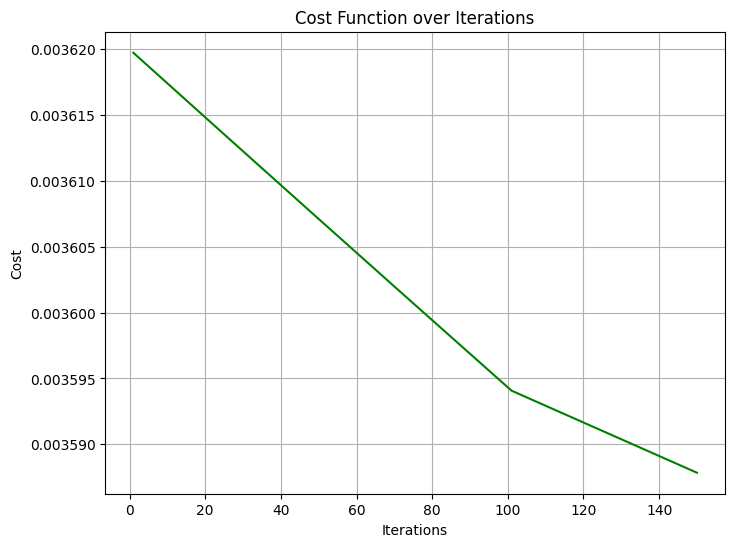

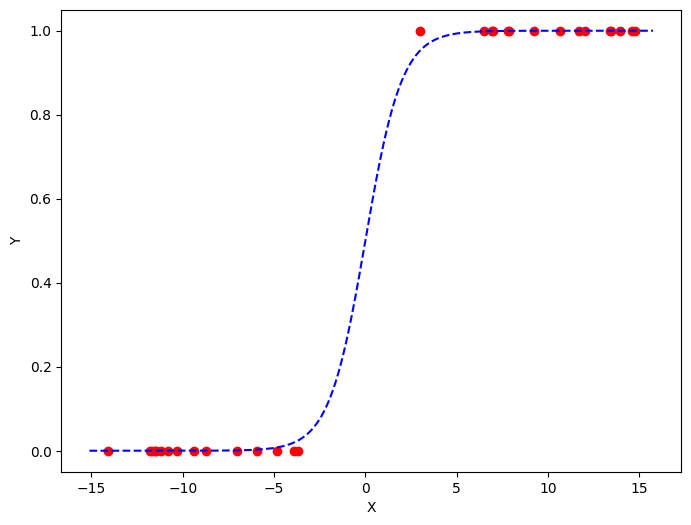

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import math


def f1(xi, w1, w0):
    return 1.0 / (1.0 + np.exp(-(w0 + w1 * xi)))

def f1_w1_derivative(xi, w1, w0):
    numerator = xi * np.exp(-(w0 + w1 * xi))
    denominator = (1 + np.exp(-(w0 + w1 * xi)))**2
    return numerator / denominator

def f1_w0_derivative(xi, w1, w0):
    numerator = np.exp(-(w0 + w1 * xi))
    denominator = (1 + np.exp(-(w0 + w1 * xi)))**2
    return numerator / denominator

def compute_cost_f1(x, y, w0, w1):
    cost = 0
    n = len(x)
    for i in range(n):
        y_predicted = f1(x[i], w1, w0)
        cost += (y[i] * math.log(y_predicted) + (1 - y[i]) * math.log((1 - y_predicted)))
    return -cost / n

def gradient_descent_f1(x, y, iterations):
    learning_rate = 0.001
    w0 = 0.0
    w1 = 1.0
    n = len(x) #num of samples
    cost_values = []

    for t in range(iterations):
        w1_sum = 0
        w0_sum = 0

        if t > 100:
            learning_rate = 0.0005
        elif t > 140:
            learning_rate = 0.0001

        for i in range(n):
            y_predicted = f1(x[i], w1, w0)
            f1_w1 = f1_w1_derivative(x[i], w1, w0)
            f1_w0 = f1_w0_derivative(x[i], w1, w0)
            w1_sum += ((y[i]*(1.0 / (y_predicted * math.log(2))) * f1_w1) - ((1 - y[i]) * (1.0 / ((1 - y_predicted) * math.log(2))) * f1_w1))
            w0_sum += ((y[i]*(1.0 / (y_predicted * math.log(2))) * f1_w0) - ((1 - y[i]) * (1.0 / ((1 - y_predicted) * math.log(2))) * f1_w0))

        w1_derivative = - w1_sum / float(n)
        w0_derivative = - w0_sum / float(n)

        # Updating weights and bias
        w1 = w1 - (learning_rate * w1_derivative)
        w0 = w0 - (learning_rate * w0_derivative)
        cost_values.append(compute_cost_f1(X, Y, w0, w1))

        # Printing the parameters for each 1000th iteration
        print(f"Iteration {t+1}: Weight  {w1}, Bias {w0}")

    return w1, w0, cost_values

data1 = np.array([[ 10.63415642, -10.31804897,  -3.91323692,  13.47455445,
         12.00245098,   7.01459213, -11.5083141 ,   7.83875   ,
        -11.21021617,   6.95282804,   7.79101979,  13.94835343,
          3.01243432,  11.67679791,  13.41197807,  14.61995534,
         -8.70743264, -14.10312612, -11.68244994,  14.75202699,
          9.25316629,  -4.82661632,  -6.99915042,   6.49562369,
        -11.46126563,  -9.38897405,  -3.68953244,  -5.95603391,
        -10.80285714, -11.78004227],
       [  1.        ,   0.        ,   0.        ,   1.        ,
          1.        ,   1.        ,   0.        ,   1.        ,
          0.        ,   1.        ,   1.        ,   1.        ,
          1.        ,   1.        ,   1.        ,   1.        ,
          0.        ,   0.        ,   0.        ,   1.        ,
          1.        ,   0.        ,   0.        ,   1.        ,
          0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ]])


X = data1[0]
Y = data1[1]
iterations = 150

# Estimating weight and bias using gradient descent
estimated_weight, estimated_bias, costs = gradient_descent_f1(X, Y, iterations)
print(f"Estimated Weight: {estimated_weight}\nEstimated Bias: {estimated_bias}")

# Making predictions using estimated parameters
Y_pred = 1.0 / (1.0 + np.exp(-(estimated_bias + estimated_weight * X)))

# Βρίσκουμε το εύρος των τιμών του X με ένα περιθώριο
x_range = np.linspace(min(X) - 1, max(X) + 1, 1000)

# Υπολογίζουμε τις προβλέψεις για όλο το εύρος του X
Y_pred_range = 1.0 / (1.0 + np.exp(-(estimated_bias + estimated_weight * x_range)))

# Δημιουργία γραφήματος
plt.figure(figsize=(8, 6))
plt.plot(range(1, iterations + 1), costs, color='green')
plt.title('Cost Function over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.grid(True)
plt.show()

# Ζωγραφίζουμε το γράφημα
plt.figure(figsize=(8, 6))
plt.scatter(X, Y, marker='o', color='red')
plt.plot(x_range, Y_pred_range, color='blue', markerfacecolor='red', markersize=10, linestyle='dashed')
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


Η f2:

Iteration 1: Weight3  3.3967725929875625, Weight1  2.198563017942928, Weight1  0.9858654556321543, Bias 0.498102171510024
Iteration 2: Weight3  3.393873602224812, Weight1  2.197258762123494, Weight1  0.9729684615158242, Bias 0.4963205207611695
Iteration 3: Weight3  3.391266667388411, Weight1  2.196072607243077, Weight1  0.961196346610509, Bias 0.49464473512490537
Iteration 4: Weight3  3.3889200143325775, Weight1  2.194991764841159, Weight1  0.9504475181154713, Bias 0.4930654818061054
Iteration 5: Weight3  3.386805794259782, Weight1  2.194005019634062, Weight1  0.9406302266342161, Bias 0.49157430439043326
Iteration 6: Weight3  3.3848995300948075, Weight1  2.193102508499715, Weight1  0.9316614945655642, Bias 0.4901635321348771
Iteration 7: Weight3  3.3831796508232856, Weight1  2.192275534471828, Weight1  0.9234661817855959, Bias 0.48882620011876077
Iteration 8: Weight3  3.3816270983320162, Weight1  2.191516409603243, Weight1  0.9159761675233175, Bias 0.48755597870258893
Iteration 9: Weig

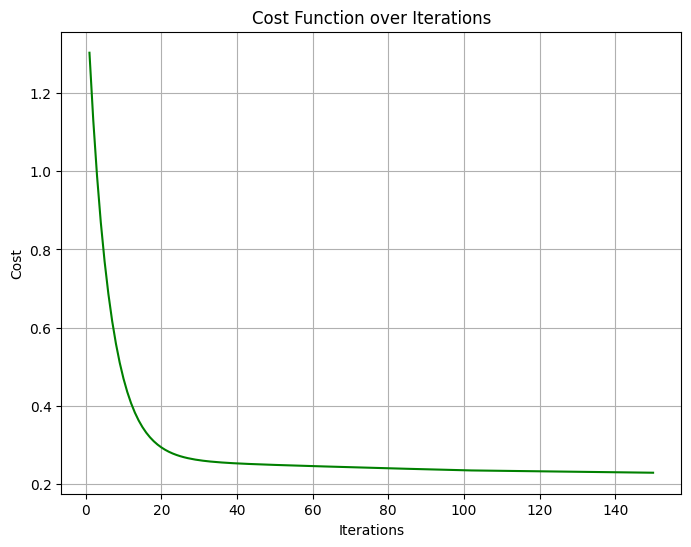

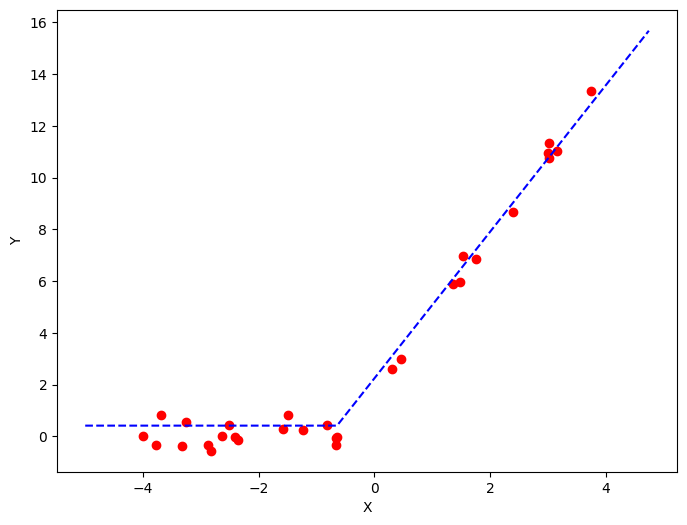

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import math

def s(r):
    if r > 0:
        return r
    else:
        return 0

def f2(xi, w3, w2, w1, w0):
    return w0 + w1*s(w2 + w3*xi)

def ds(r):
    if r > 0:
        return 1
    else:
        return 0

def f2_w3_derivative(xi, w3, w2, w1):
    return w1 * ds(w2 + w3*xi) * xi

def f2_w2_derivative(xi, w3, w2, w1):
    return w1 * ds(w2 + w3*xi)

def f2_w1_derivative(xi, w3, w2):
    return s(w2 + w3*xi)

def f2_w0_derivative():
    return 1

def compute_cost_f2(x, y, w3, w2, w1, w0):
    cost = 0
    n = len(x)
    for i in range(n):
        y_predicted = f2(x[i], w3, w2, w1, w0)
        cost += (y[i] - y_predicted)**2
    return cost / n

def gradient_descent_f2(x, y, iterations):
    learning_rate = 0.001
    w0 = 0.5
    w1 = 1.0
    w2 = 2.2
    w3 = 3.4
    n = len(x) #num of samples
    cost_values = []

    for t in range(iterations):
        w3_sum = 0
        w2_sum = 0
        w1_sum = 0
        w0_sum = 0

        if t > 100:
            learning_rate = 0.0005
        elif t > 140:
            learning_rate = 0.0001

        for i in range(n):
            y_predicted = f2(x[i], w3, w2, w1, w0)
            f2_w3 = f2_w3_derivative(x[i], w3, w2, w1)
            f2_w2 = f2_w2_derivative(x[i], w3, w2, w1)
            f2_w1 = f2_w1_derivative(x[i], w3, w2)
            f2_w0 = f2_w0_derivative()

            w3_sum += 2 * (y[i] - y_predicted) * (-f2_w3)
            w2_sum += 2 * (y[i] - y_predicted) * (-f2_w2)
            w1_sum += 2 * (y[i] - y_predicted) * (-f2_w1)
            w0_sum += 2 * (y[i] - y_predicted) * (-f2_w0)

        w3_derivative = w3_sum / float(n)
        w2_derivative = w2_sum / float(n)
        w1_derivative = w1_sum / float(n)
        w0_derivative = w0_sum / float(n)

        # Updating weights and bias
        w3 = w3 - (learning_rate * w3_derivative)
        w2 = w2 - (learning_rate * w2_derivative)
        w1 = w1 - (learning_rate * w1_derivative)
        w0 = w0 - (learning_rate * w0_derivative)
        cost_values.append(compute_cost_f2(X, Y, w3, w2, w1, w0))

        # Printing the parameters for each 1000th iteration
        print(f"Iteration {t+1}: Weight3  {w3}, Weight1  {w2}, Weight1  {w1}, Bias {w0}")

    return w3, w2, w1, w0, cost_values


data2 = np.array([[-6.63823962e-01,  1.76259595e+00, -3.99908500e+00,
        -1.58133942e+00, -2.82595287e+00, -3.26129124e+00,
        -2.50991831e+00, -1.23551418e+00, -8.25860206e-01,
         3.10533872e-01, -6.46443885e-01,  1.48175600e+00,
        -2.36438200e+00,  3.02493949e+00, -3.78089925e+00,
         1.36374008e+00, -6.61561581e-01,  4.69518628e-01,
        -2.87690449e+00, -2.41518809e+00,  2.40595655e+00,
         3.74609261e+00, -1.49260657e+00,  1.53858093e+00,
         3.01111322e+00,  3.15685331e+00, -3.31964631e+00,
        -3.68756173e+00, -2.64135664e+00,  3.02514003e+00],
       [-7.76859909e-02,  6.84885863e+00,  2.11068734e-02,
         2.91407607e-01, -5.50309589e-01,  5.72361855e-01,
         4.50795360e-01,  2.51247169e-01,  4.50427975e-01,
         2.58973769e+00, -7.76767080e-04,  5.97738329e+00,
        -1.33944040e-01,  1.13399962e+01, -3.45830376e-01,
         5.89284348e+00, -3.28271093e-01,  2.98595306e+00,
        -3.35623065e-01, -6.33229946e-03,  8.65921447e+00,
         1.33554857e+01,  8.29901089e-01,  6.98676486e+00,
         1.09374219e+01,  1.10267454e+01, -3.73579147e-01,
         8.46227301e-01,  2.54038774e-02,  1.07569223e+01]])

X = data2[0]
Y = data2[1]
iterations = 150

# Estimating weight and bias using gradient descent
estimated_weight3, estimated_weight2, estimated_weight, estimated_bias, costs = gradient_descent_f2(X, Y, iterations)
print(f"Estimated Weight: {estimated_weight}\nEstimated Bias: {estimated_bias}")

# Making predictions using estimated parameters
Y_pred = estimated_bias + estimated_weight * (estimated_weight2 + estimated_weight3*X > 0) * (estimated_weight2 + estimated_weight3*X)

# Βρίσκουμε το εύρος των τιμών του X με ένα περιθώριο
x_range = np.linspace(min(X) - 1, max(X) + 1, 1000)

# Υπολογίζουμε τις προβλέψεις για όλο το εύρος του X
Y_pred_range = estimated_bias + estimated_weight * (estimated_weight2 + estimated_weight3*x_range > 0) * (estimated_weight2 + estimated_weight3*x_range)

# Δημιουργία γραφήματος
plt.figure(figsize=(8, 6))
plt.plot(range(1, iterations + 1), costs, color='green')
plt.title('Cost Function over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.grid(True)
plt.show()

# Ζωγραφίζουμε το γράφημα
plt.figure(figsize=(8, 6))
plt.scatter(X, Y, marker='o', color='red')
plt.plot(x_range, Y_pred_range, color='blue', markerfacecolor='red', markersize=10, linestyle='dashed')
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


Υποερώτημα 2.2.2:

Στην f1 τόσο το κόστος όσο και η προσέγγιση των δεδομένων δεν παρουσιάζουν σημαντικές αλλαγές. Είναι σχεδόν τα ίδια με τα 2 προηγούμενα υποερωτήματα. Στην f2 παρατηρείται ένα ελάχιστα βελτιωμένο κόστος και κατ' επέκτασην προσέγγιση στα δεδομένα στο δεύτερο γράφημα.

Η f1:

Iteration 1: Weight  1.0000193170525558, Bias -2.2041505474611036e-07
Iteration 2: Weight  1.0000386133097194, Bias -4.4055191418533443e-07
Iteration 3: Weight  1.0000578887761653, Bias -6.604107628430351e-07
Iteration 4: Weight  1.0000771434565614, Bias -8.799917850013998e-07
Iteration 5: Weight  1.0000963773555702, Bias -1.0992951646996435e-06
Iteration 6: Weight  1.0001155904778483, Bias -1.3183210857342049e-06
Iteration 7: Weight  1.000134782828046, Bias -1.5370697316589375e-06
Iteration 8: Weight  1.0001539544108082, Bias -1.7555412857853077e-06
Iteration 9: Weight  1.0001731052307734, Bias -1.9737359311825926e-06
Iteration 10: Weight  1.0001922352925745, Bias -2.1916538506780704e-06
Iteration 11: Weight  1.0002113446008383, Bias -2.409295226857219e-06
Iteration 12: Weight  1.000230433160186, Bias -2.626660242063913e-06
Iteration 13: Weight  1.0002495009752326, Bias -2.843749078400608e-06
Iteration 14: Weight  1.0002685480505875, Bias -3.0605619177285455e-06
Iteration 15: Weight  

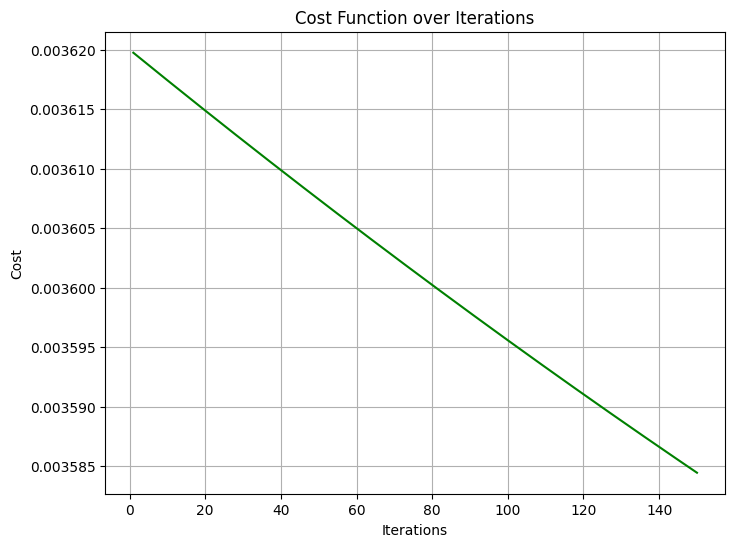

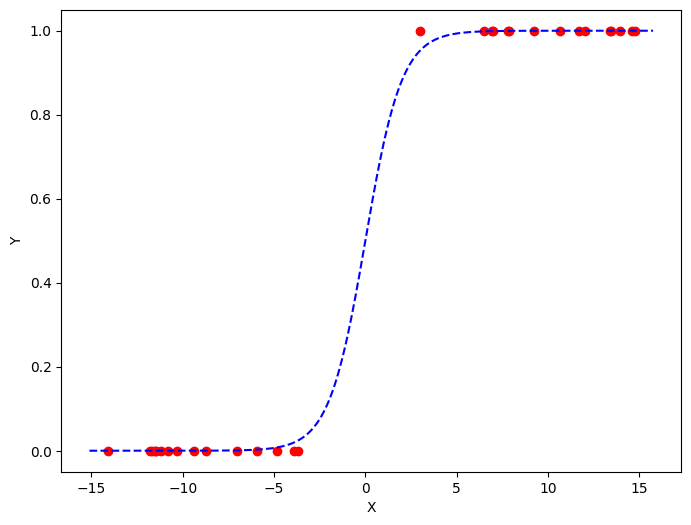

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import math


def f1(xi, w1, w0):
    return 1.0 / (1.0 + np.exp(-(w0 + w1 * xi)))

def f1_w1_derivative(xi, w1, w0):
    numerator = xi * np.exp(-(w0 + w1 * xi))
    denominator = (1 + np.exp(-(w0 + w1 * xi)))**2
    return numerator / denominator

def f1_w0_derivative(xi, w1, w0):
    numerator = np.exp(-(w0 + w1 * xi))
    denominator = (1 + np.exp(-(w0 + w1 * xi)))**2
    return numerator / denominator

def compute_cost_f1(x, y, w0, w1):
    cost = 0
    n = len(x)
    for i in range(n):
        y_predicted = f1(x[i], w1, w0)
        cost += (y[i] * math.log(y_predicted) + (1 - y[i]) * math.log((1 - y_predicted)))
    return -cost / n

def gradient_descent_f1(x, y, iterations):
    learning_rate = 0.001
    w0 = 0.0
    w1 = 1.0
    n = len(x) #num of samples
    cost_values = []

    for t in range(iterations):
        w1_sum = 0
        w0_sum = 0

        for i in range(n):
            y_predicted = f1(x[i], w1, w0)
            f1_w1 = f1_w1_derivative(x[i], w1, w0)
            f1_w0 = f1_w0_derivative(x[i], w1, w0)
            w1_sum += ((y[i]*(1.0 / (y_predicted * math.log(2))) * f1_w1) - ((1 - y[i]) * (1.0 / ((1 - y_predicted) * math.log(2))) * f1_w1))
            w0_sum += ((y[i]*(1.0 / (y_predicted * math.log(2))) * f1_w0) - ((1 - y[i]) * (1.0 / ((1 - y_predicted) * math.log(2))) * f1_w0))

        w1_derivative = - w1_sum / float(n)
        w0_derivative = - w0_sum / float(n)

        # Updating weights and bias
        w1 = w1 - (learning_rate * w1_derivative)
        w0 = w0 - (learning_rate * w0_derivative)
        cost_values.append(compute_cost_f1(X, Y, w0, w1))

        learning_rate -= 0.000001

        # Printing the parameters for each 1000th iteration
        print(f"Iteration {t+1}: Weight  {w1}, Bias {w0}")

    return w1, w0, cost_values

data1 = np.array([[ 10.63415642, -10.31804897,  -3.91323692,  13.47455445,
         12.00245098,   7.01459213, -11.5083141 ,   7.83875   ,
        -11.21021617,   6.95282804,   7.79101979,  13.94835343,
          3.01243432,  11.67679791,  13.41197807,  14.61995534,
         -8.70743264, -14.10312612, -11.68244994,  14.75202699,
          9.25316629,  -4.82661632,  -6.99915042,   6.49562369,
        -11.46126563,  -9.38897405,  -3.68953244,  -5.95603391,
        -10.80285714, -11.78004227],
       [  1.        ,   0.        ,   0.        ,   1.        ,
          1.        ,   1.        ,   0.        ,   1.        ,
          0.        ,   1.        ,   1.        ,   1.        ,
          1.        ,   1.        ,   1.        ,   1.        ,
          0.        ,   0.        ,   0.        ,   1.        ,
          1.        ,   0.        ,   0.        ,   1.        ,
          0.        ,   0.        ,   0.        ,   0.        ,
          0.        ,   0.        ]])


X = data1[0]
Y = data1[1]
iterations = 150

# Estimating weight and bias using gradient descent
estimated_weight, estimated_bias, costs = gradient_descent_f1(X, Y, iterations)
print(f"Estimated Weight: {estimated_weight}\nEstimated Bias: {estimated_bias}")

# Making predictions using estimated parameters
Y_pred = 1.0 / (1.0 + np.exp(-(estimated_bias + estimated_weight * X)))

# Βρίσκουμε το εύρος των τιμών του X με ένα περιθώριο
x_range = np.linspace(min(X) - 1, max(X) + 1, 1000)

# Υπολογίζουμε τις προβλέψεις για όλο το εύρος του X
Y_pred_range = 1.0 / (1.0 + np.exp(-(estimated_bias + estimated_weight * x_range)))

# Δημιουργία γραφήματος
plt.figure(figsize=(8, 6))
plt.plot(range(1, iterations + 1), costs, color='green')
plt.title('Cost Function over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.grid(True)
plt.show()

# Ζωγραφίζουμε το γράφημα
plt.figure(figsize=(8, 6))
plt.scatter(X, Y, marker='o', color='red')
plt.plot(x_range, Y_pred_range, color='blue', markerfacecolor='red', markersize=10, linestyle='dashed')
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


Η f2:

Iteration 1: Weight3  3.3967725929875625, Weight1  2.198563017942928, Weight1  0.9858654556321543, Bias 0.498102171510024
Iteration 2: Weight3  3.3938765012155745, Weight1  2.197260066379313, Weight1  0.9729813585099405, Bias 0.4963223024119184
Iteration 3: Weight3  3.3912744923253584, Weight1  2.19607616735295, Weight1  0.9612316669236391, Bias 0.49464976276933703
Iteration 4: Weight3  3.388934109439671, Weight1  2.1949982559492467, Weight1  0.9505120280673006, Bias 0.4930749586307847
Iteration 5: Weight3  3.3868269714142487, Weight1  2.1940149010324337, Weight1  0.9407284440826312, Bias 0.4915892197316545
Iteration 6: Weight3  3.3849281885166786, Weight1  2.1931160719128444, Weight1  0.9317961175806878, Bias 0.49018470132166847
Iteration 7: Weight3  3.3832158724656067, Weight1  2.1922929425798734, Weight1  0.9236384477912282, Bias 0.4888542980026793
Iteration 8: Weight3  3.3816707239678614, Weight1  2.191537726802739, Weight1  0.9161861539226854, Bias 0.487591567836022
Iteration 9: W

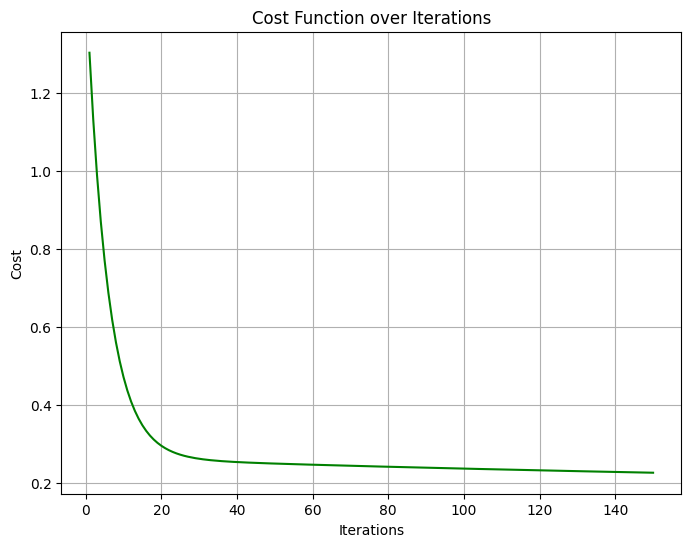

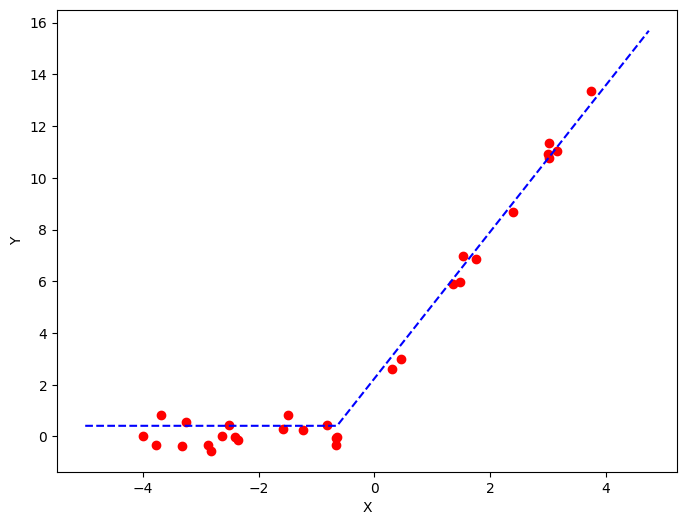

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import math

def s(r):
    if r > 0:
        return r
    else:
        return 0

def f2(xi, w3, w2, w1, w0):
    return w0 + w1*s(w2 + w3*xi)

def ds(r):
    if r > 0:
        return 1
    else:
        return 0

def f2_w3_derivative(xi, w3, w2, w1):
    return w1 * ds(w2 + w3*xi) * xi

def f2_w2_derivative(xi, w3, w2, w1):
    return w1 * ds(w2 + w3*xi)

def f2_w1_derivative(xi, w3, w2):
    return s(w2 + w3*xi)

def f2_w0_derivative():
    return 1

def compute_cost_f2(x, y, w3, w2, w1, w0):
    cost = 0
    n = len(x)
    for i in range(n):
        y_predicted = f2(x[i], w3, w2, w1, w0)
        cost += (y[i] - y_predicted)**2
    return cost / n

def gradient_descent_f2(x, y, iterations):
    learning_rate = 0.001
    w0 = 0.5
    w1 = 1.0
    w2 = 2.2
    w3 = 3.4
    n = len(x) #num of samples
    cost_values = []

    for t in range(iterations):
        w3_sum = 0
        w2_sum = 0
        w1_sum = 0
        w0_sum = 0

        for i in range(n):
            y_predicted = f2(x[i], w3, w2, w1, w0)
            f2_w3 = f2_w3_derivative(x[i], w3, w2, w1)
            f2_w2 = f2_w2_derivative(x[i], w3, w2, w1)
            f2_w1 = f2_w1_derivative(x[i], w3, w2)
            f2_w0 = f2_w0_derivative()

            w3_sum += 2 * (y[i] - y_predicted) * (-f2_w3)
            w2_sum += 2 * (y[i] - y_predicted) * (-f2_w2)
            w1_sum += 2 * (y[i] - y_predicted) * (-f2_w1)
            w0_sum += 2 * (y[i] - y_predicted) * (-f2_w0)

        w3_derivative = w3_sum / float(n)
        w2_derivative = w2_sum / float(n)
        w1_derivative = w1_sum / float(n)
        w0_derivative = w0_sum / float(n)

        # Updating weights and bias
        w3 = w3 - (learning_rate * w3_derivative)
        w2 = w2 - (learning_rate * w2_derivative)
        w1 = w1 - (learning_rate * w1_derivative)
        w0 = w0 - (learning_rate * w0_derivative)
        cost_values.append(compute_cost_f2(X, Y, w3, w2, w1, w0))

        learning_rate -= 0.000001

        # Printing the parameters for each 1000th iteration
        print(f"Iteration {t+1}: Weight3  {w3}, Weight1  {w2}, Weight1  {w1}, Bias {w0}")

    return w3, w2, w1, w0, cost_values


data2 = np.array([[-6.63823962e-01,  1.76259595e+00, -3.99908500e+00,
        -1.58133942e+00, -2.82595287e+00, -3.26129124e+00,
        -2.50991831e+00, -1.23551418e+00, -8.25860206e-01,
         3.10533872e-01, -6.46443885e-01,  1.48175600e+00,
        -2.36438200e+00,  3.02493949e+00, -3.78089925e+00,
         1.36374008e+00, -6.61561581e-01,  4.69518628e-01,
        -2.87690449e+00, -2.41518809e+00,  2.40595655e+00,
         3.74609261e+00, -1.49260657e+00,  1.53858093e+00,
         3.01111322e+00,  3.15685331e+00, -3.31964631e+00,
        -3.68756173e+00, -2.64135664e+00,  3.02514003e+00],
       [-7.76859909e-02,  6.84885863e+00,  2.11068734e-02,
         2.91407607e-01, -5.50309589e-01,  5.72361855e-01,
         4.50795360e-01,  2.51247169e-01,  4.50427975e-01,
         2.58973769e+00, -7.76767080e-04,  5.97738329e+00,
        -1.33944040e-01,  1.13399962e+01, -3.45830376e-01,
         5.89284348e+00, -3.28271093e-01,  2.98595306e+00,
        -3.35623065e-01, -6.33229946e-03,  8.65921447e+00,
         1.33554857e+01,  8.29901089e-01,  6.98676486e+00,
         1.09374219e+01,  1.10267454e+01, -3.73579147e-01,
         8.46227301e-01,  2.54038774e-02,  1.07569223e+01]])

X = data2[0]
Y = data2[1]
iterations = 150

# Estimating weight and bias using gradient descent
estimated_weight3, estimated_weight2, estimated_weight, estimated_bias, costs = gradient_descent_f2(X, Y, iterations)
print(f"Estimated Weight: {estimated_weight}\nEstimated Bias: {estimated_bias}")

# Making predictions using estimated parameters
Y_pred = estimated_bias + estimated_weight * (estimated_weight2 + estimated_weight3*X > 0) * (estimated_weight2 + estimated_weight3*X)

# Βρίσκουμε το εύρος των τιμών του X με ένα περιθώριο
x_range = np.linspace(min(X) - 1, max(X) + 1, 1000)

# Υπολογίζουμε τις προβλέψεις για όλο το εύρος του X
Y_pred_range = estimated_bias + estimated_weight * (estimated_weight2 + estimated_weight3*x_range > 0) * (estimated_weight2 + estimated_weight3*x_range)

# Δημιουργία γραφήματος
plt.figure(figsize=(8, 6))
plt.plot(range(1, iterations + 1), costs, color='green')
plt.title('Cost Function over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.grid(True)
plt.show()

# Ζωγραφίζουμε το γράφημα
plt.figure(figsize=(8, 6))
plt.scatter(X, Y, marker='o', color='red')
plt.plot(x_range, Y_pred_range, color='blue', markerfacecolor='red', markersize=10, linestyle='dashed')
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


Παρακάτω το ερώτημα 3:

Ο αλγοριθμος PCA με eigen composition και covariance matrix.

Με βοήθησε το site: https://pieriantraining.com/machine-learning-in-python-principal-component-analysis-pca/

In [14]:
import numpy as np

def PCA_eig_decomp(X, new_dim):
    # Κανονικοποίηση των δεδομένων
    X_normalized = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

    # Υπολογισμός πίνακα συνδιακύμανσης
    cov_matrix = np.cov(X_normalized.T)

    # Υπολογισμός ιδιοδιανυσμάτων και ιδιοτιμών
    eigen_values, eigen_vectors = np.linalg.eigh(cov_matrix)

    # Ταξινόμηση ιδιοδιανυσμάτων και ιδιοτιμών σε φθίνουσα σειρά της ιδιοτιμής
    sorted_index = np.argsort(eigen_values)[::-1]
    sorted_eigenvalue = eigen_values[sorted_index]
    sorted_eigenvectors = eigen_vectors[:,sorted_index]

    return sorted_eigenvectors[:,:new_dim]  # Κορυφαία new_dim ιδιοδιανύσματα

Ζητουμενο 1:

In [15]:
import numpy as np
import os
import cv2

def loadImages(path, set_number):
    images = []
    labels = []

    # Καθορίζουμε τα εύρη των εικόνων για κάθε set
    if set_number == "Set_1":
        start_index = 1
        end_index = 7
    elif set_number == "Set_2":
        start_index = 8
        end_index = 19
    elif set_number == "Set_3":
        start_index = 20
        end_index = 31
    elif set_number == "Set_4":
        start_index = 32
        end_index = 45
    elif set_number == "Set_5":
        start_index = 46
        end_index = 64
    else:
        raise ValueError("Invalid set number")

    # Διαβάζουμε τις εικόνες από τον φάκελο
    for filename in os.listdir(path):
        if filename.endswith(".png"):
            filename_parts = filename.split("_")
            current_person_number = int(filename_parts[0][-2:])  # Ανάκτηση αριθμού προσώπου από το όνομα του αρχείου
            pic_number = int(filename_parts[1][:2])  # Ανάκτηση αριθμού εικονας
            if start_index <= pic_number <= end_index:
                img_path = os.path.join(path, filename)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if img is not None:
                    images.append(img.flatten())  # Μετατροπή της εικόνας σε διάνυσμα και προσθήκη στη λίστα
                    labels.append(current_person_number)  # Υπολογισμός της ετικέτας για το πρόσωπο και προσθήκη στη λίστα

    return np.array(images), np.array(labels)


folder_path = "/content/gdrive/MyDrive/Anagnwrish_Protupwn/faces" # Φάκελος με τις εικόνες προσώπων
set_number = "Set_1"
images, labels = loadImages(folder_path, set_number)

print("Διαστάσεις πίνακα εικόνων:", images.shape)
print("Διαστάσεις πίνακα ετικετών:", labels.shape)


Διαστάσεις πίνακα εικόνων: (70, 2500)
Διαστάσεις πίνακα ετικετών: (70,)


Ζητουμενο 2:

Παρατηρώ ότι οι σκιές αρχιζουν και ψιλοχάνονται, και ότι οι εικόνες προσεγγίζονται όχι τέλεια αλλά καλά διότι η PCA όπως φαίνεται κρατάει τα κύρια χαρακτηριστικά των προσώπων.

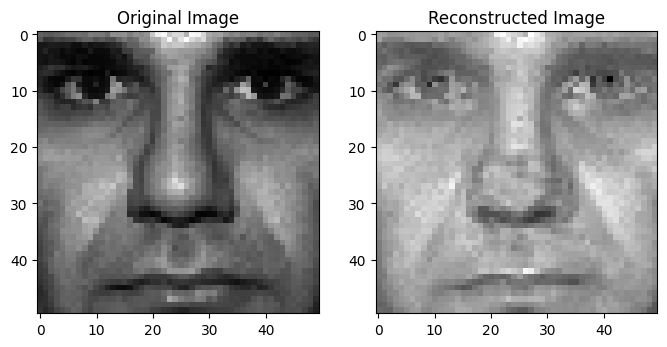

In [19]:
import matplotlib.pyplot as plt
import numpy as np

def regression_and_print_rand(X_new, principal_components, random_image_index):
    # Ανακατασκευή της τυχαίας εικόνας
    random_image = X[random_image_index].reshape(50, 50)
    reconstructed_image = np.dot(X_new[random_image_index], principal_components.T).reshape(50, 50)

    # Εμφάνιση της αρχικής και ανακατασκευασμένης εικόνας
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(random_image, cmap='gray')
    plt.subplot(1, 2, 2)
    plt.title('Reconstructed Image')
    plt.imshow(reconstructed_image, cmap='gray')
    plt.show()

set_number = "Set_1"
images, labels = loadImages(folder_path, set_number)
X = np.array(images)

new_dim = 30
# Επιλογή new_dim κορυφαίων ιδιοδιανυσμάτων
principal_components = PCA_eig_decomp(X, new_dim)

# Υπολογισμός νέων χαρακτηριστικών
X_new = np.dot(X, principal_components)

# Εκτέλεση της ανακατασκευής μίας τυχαίας εικόνας από το Set_1
random_image_index = np.random.randint(0, len(images))
regression_and_print_rand(X_new, principal_components, random_image_index)

Ζητουμενο 3:

Παρατηρώ ότι το σφάλμα στην αρχή μειώνεται εκθετικά, περίπου μέχρι τις 30 διαστάσεις, και μετά από το σημείο εκείνο μειώνεται με πιό αργούς ρυθμούς.

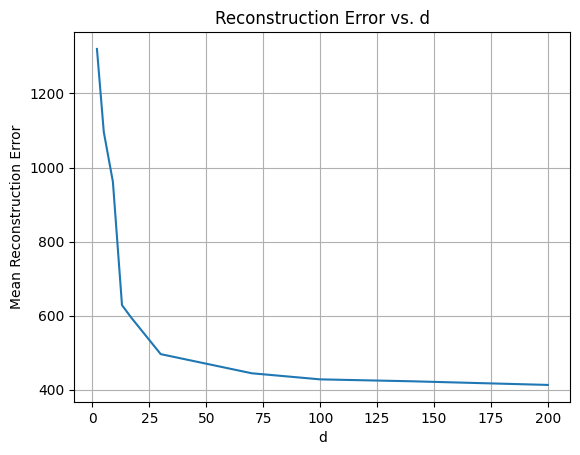

In [20]:
import numpy as np
import matplotlib.pyplot as plt

errors = []  # Λίστα για να αποθηκεύσουμε το μέσο σφάλμα ανακατασκευής για κάθε τιμή του d
dlist = [2, 5, 9, 13, 17, 30, 70, 100, 140, 200]  # Τα 10 d που διάλεξα
def ten_eigenfaces(images):
    multidim_components = {}  # Για το ζητούμενο 5 στην συνεχεια.
    for d in dlist:
        # Εκπαίδευση της μεθόδου Eigenfaces για την τρέχουσα τιμή του d
        X = np.array(images)

        # Επιλογή new_dim κορυφαίων ιδιοδιανυσμάτων
        principal_components = PCA_eig_decomp(X, d)

        # Υπολογισμός νέων χαρακτηριστικών
        X_new = np.dot(X, principal_components)

        # Ανακατασκευή όλων των εικόνων του Set_1 χρησιμοποιώντας τις νέες διαστάσεις d
        reconstructed_data = np.dot(X_new, principal_components.T) # Αντίστροφη μετατροπή των δεδομένων από τη νέα διάσταση του PCA στην αρχική

        # Επαναφορά των δεδομένων στη μορφή των εικόνων
        reconstructed_images = reconstructed_data.reshape(-1, 50, 50)

        # Υπολογισμός του σφάλματος ανακατασκευής για κάθε εικόνα του Set_1
        reconstruction_errors = []
        for i in range(len(X)):
            original_image = X[i].reshape(50, 50)
            reconstructed_image = reconstructed_images[i]
            error = np.linalg.norm(original_image - reconstructed_image, ord=2)  # Υπολογισμός της 2-νόρμας
            reconstruction_errors.append(error)

        # Υπολογισμός του μέσου σφάλματος ανακατασκευής για την τρέχουσα τιμή του d
        mean_error = np.mean(reconstruction_errors)
        errors.append(mean_error)
        multidim_components[d] = principal_components  # Αποθήκευση των principal components για την τρέχουσα τιμή του d
    return multidim_components

images, labels = loadImages(folder_path, "Set_1")
ten_eigenfaces(images)
# Απεικόνιση του σφάλματος σε διάγραμμα
plt.plot(dlist, errors)
plt.xlabel('d')
plt.ylabel('Mean Reconstruction Error')
plt.title('Reconstruction Error vs. d')
plt.grid(True)
plt.show()


Ζητούμενο 4:

Παρατηρώ πως τα ιδιοδιανύσματα αυτά όπως φαίνεται κρατάνε τις πληροφορίες των πιο δομικών και βασικών συνιστωσών του προσώπου. Τα ονόμασα eigenface 1, 2, ... επειδη καταλαβαίνω τώρα ότι ειναι στην ουσία "ιδιοπρόσωπα", δηλαδή τα πρόσωπα που απεικονίζονται με βάση μόνο τα συγκεκριμένα ιδιοδιανύσματα. Και εφόσον είναι τα κορυφαία 9 ιδιοδιανύσματα σημαίνει τα 9 σημαντικότερα, οπότε όταν τα απεικονίζουμε μπορούμε να δούμε τί πραγματικά θεωρεί σημαντικό η μέθοδος Eigenfaces και ποιές δομές/χαρακτηριστικά του προσώπου αντιλαμβάνεται ως σημαντικά. Κάθε ενα ιδιοδιάνυσμα παρατηρώ ότι αντιστοιχεί σε μία διαφορετική δομή! Για παράδειγμα το πρώτο στην φωτεινότητα, το δεύτερο στις σκιές και άλλα στο βάθος, τις γωνίες κλπ. Όλα αυτά βγάζουν και νόημα μαθηματικά αφού τα ιδιοδιανύσματα εκφράζουν στην πραγματικότητα τις διαφορετικές κατευθύνσεις του πίνακα συνδιακύμανσης.

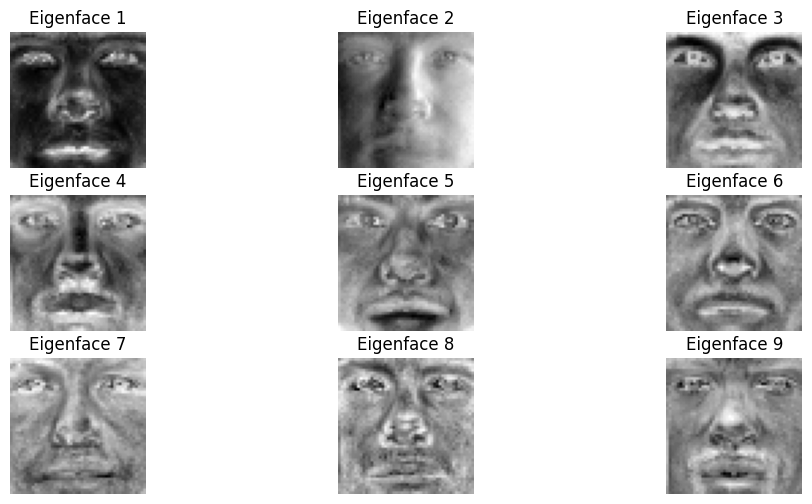

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Απεικόνιση των 9 κύριων ιδιοδιανυσμάτων σε μορφή εικόνας
plt.figure(figsize=(12, 6))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(principal_components[:, i].reshape(50, 50), cmap='gray')
    plt.title('Eigenface {}'.format(i + 1))
    plt.axis('off')
plt.show()

Ζητούμενο 5:

Στον knn με βοήθησε το σαιτ: https://scikit-learn.org/stable/auto_examples/neighbors/plot_nca_dim_reduction.html

α) Στο Set_2 οι 13 διαστάσεις μοιάζουν οι πιο αποδοτικές μιας και με τοσο λιγες διαστάσεις η ακρίβεια δεν διαφέρει και πολυ απο τις 180 διαστάσεις. Είναι εκει που κάνει το σημείο καμπής και μετά αρχίζει και αυξάνεται με πολύ αργότερους ρυθμούς η ακρίβεια.
Και στα υπόλοιπα sets παραμένει κοντά στην βέλτιστη διάσταση που θα επιλέγαμε. Ωστόσο η απόδοση είναι λογικό και αναμενόμενο να πέφτει κατά πολύ όσο πάμε και σε κάθε επόμενο Set. Αυτό συμβαίνει διότι όσο τα sets προχωράνε έχουμε άλλες πλευρές φωτισμού, εώς και το Set_5 που είναι πολύ σκοτεινές οι εικόνες σε σύγκριση με το Set_1 με το οποίο εκπαιδεύσαμε τον ταξινομητή μας. Οπότε θα έλεγε κανείς οτι έγινε κακό split στο training_set και test_set, και έτσι δυσκολευόμαστε να γενικεύσουμε διότι δεν έχουμε σε κάθε set εικόνες οι οποίες αντιπροσωπεύουν το σύνολο όλων των εικόνων.

β) Η διάσταση 30 είναι η σταθερότερη σε όλα τα sets. Είναι κοντά στην καλύτερη απόδοση σε όλα τα sets.

γ) Θα επέλεγα την διάσταση 30 επειδή παραμένει κοντά στην καλύτερη απόδοση σε όλα τα sets και είναι σταθερή. Οπότε επειδή θα με ενδιέφερε να εξετάζω σε όλα τα sets τον κοντινότερο γείτονα και όχι μονο στο Set_2, και λόγω της σταθερότητας, θα επέλεγα το 30.

Calculating accuracy for Set_1


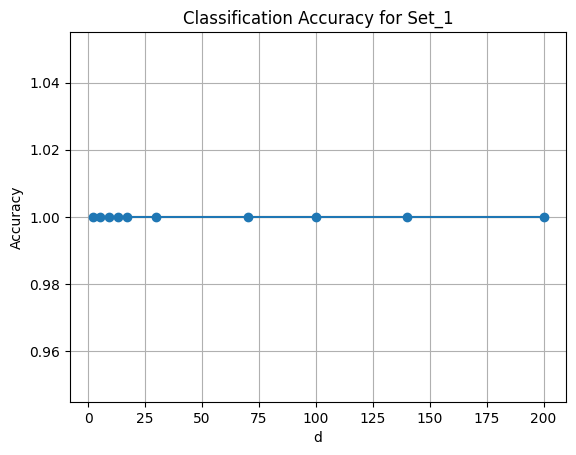

Calculating accuracy for Set_2


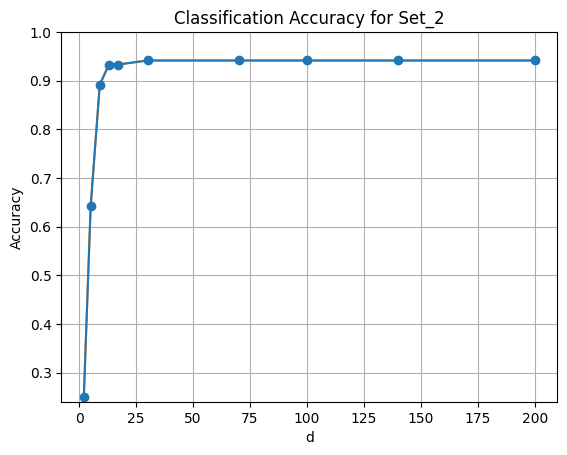

Calculating accuracy for Set_3


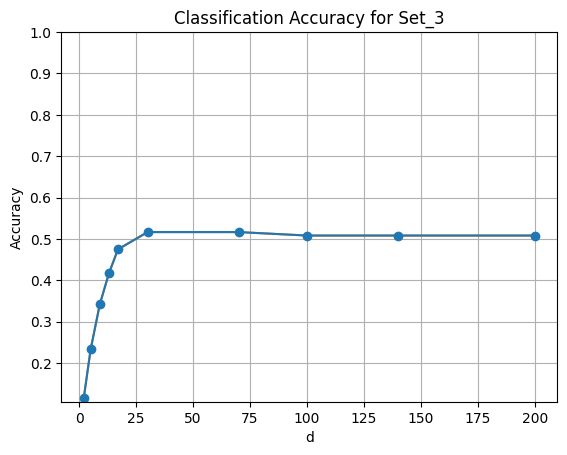

Calculating accuracy for Set_4


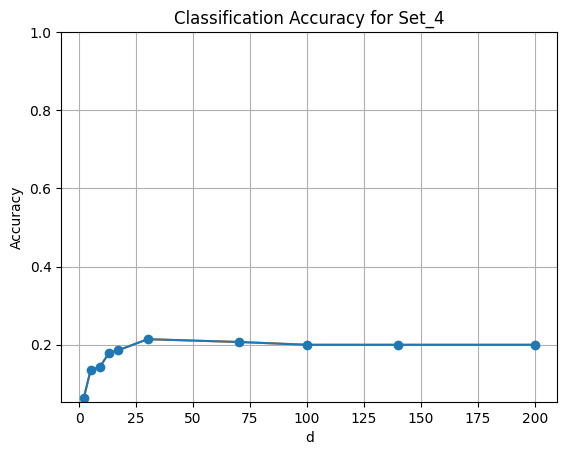

Calculating accuracy for Set_5


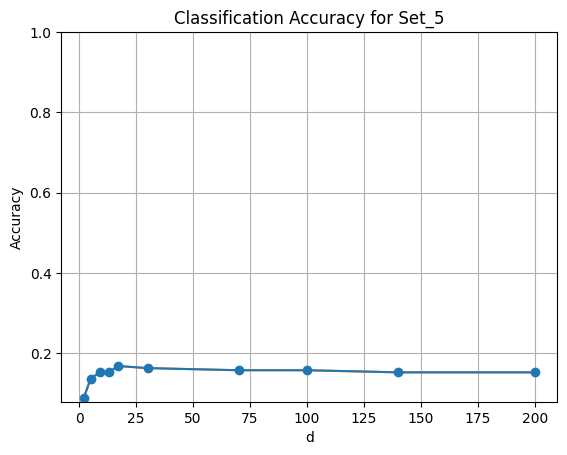

In [22]:
from sklearn.neighbors import KNeighborsClassifier

def knn_train(training_set, training_labels):
    X_train = training_set
    y_train = training_labels

    # Δημιουργία του ταξινομητή k-NN
    knn_classifier = KNeighborsClassifier(n_neighbors=1, metric="euclidean")

    # Εκπαίδευση του ταξινομητή με τα δεδομένα εκπαίδευσης και τις ετικέτες τους
    knn_classifier.fit(X_train, y_train)

    return knn_classifier

def plot_classification_accuracy(accuracies, d_values, set_name):
    # Απεικόνιση της ακρίβειας ταξινόμησης ως προς τον αριθμό συνιστωσών (d)
    plt.errorbar(d_values, accuracies, fmt='-o', capsize=5)  # Προσθήκη μικρών βουλών στη γραφική παράσταση
    plt.plot(d_values, accuracies)
    plt.xlabel('d')
    plt.ylabel('Accuracy')
    plt.title(f'Classification Accuracy for {set_name}')
    if max(accuracies) < 1:
        plt.ylim(min(accuracies) - 0.01, 1)
    plt.grid(True)
    plt.show()

sets = ["Set_1", "Set_2", "Set_3", "Set_4", "Set_5"]

images, y_train = loadImages(folder_path, "Set_1")
X_train = np.array(images)
X_train_components = ten_eigenfaces(X_train)

# Εκπαίδευση του ταξινομητή k-NN και υπολογισμός ακρίβειας για κάθε d και κάθε set
for set_name in sets:
    print(f"Calculating accuracy for {set_name}")
    d_values = []
    accuracies = []

    images, y_test = loadImages(folder_path, set_name)
    X_test = np.array(images)
    X_test_components = ten_eigenfaces(X_test)
    for d, principal_components in X_test_components.items():
        # Μείωση της διάστασης των δεδομένων εκπαίδευσης και ελέγχου
        X_train_new = np.dot(X_train, principal_components)
        X_test_new = np.dot(X_test, principal_components)

        # Εκπαίδευση του ταξινομητή k-NN
        knn_classifier = knn_train(X_train_new, y_train)

        # Πρόβλεψη των ετικετών των δεδομένων ελέγχου
        y_pred = knn_classifier.predict(X_test_new)

        # Υπολογισμός ακρίβειας
        accuracy = knn_classifier.score(X_test_new, y_test)

        d_values.append(d)
        accuracies.append(accuracy)

    # Απεικόνιση της ακρίβειας ταξινόμησης για το τρέχον set
    plot_classification_accuracy(accuracies, d_values, set_name)

Ζητούμενο 6:

Όπως αναμενόταν από το ερώτημα η διασταση που διαλέξαμε προσεγγίζει αρκετά καλά την εικόνα. Βέβαια, όσο πάμε και στα επόμενα sets που είναι και πιο σκοτεινά, η ποιότητα της εικόνας μειώνεται που είναι επίσης λογικό.

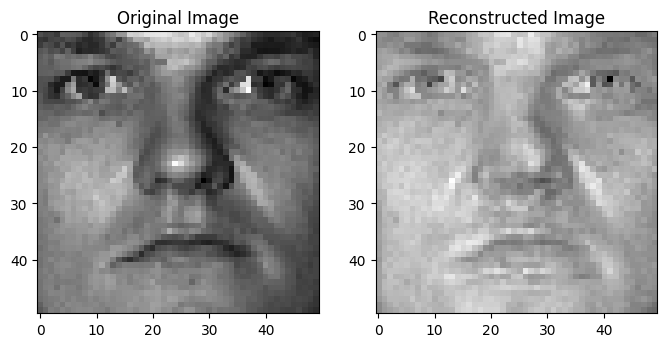

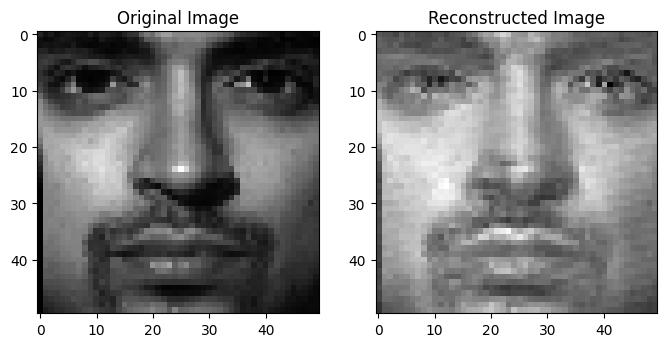

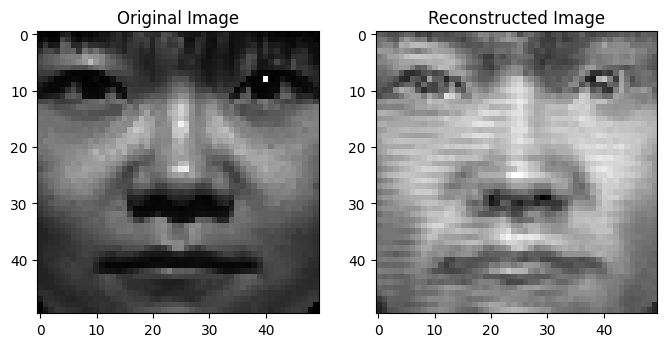

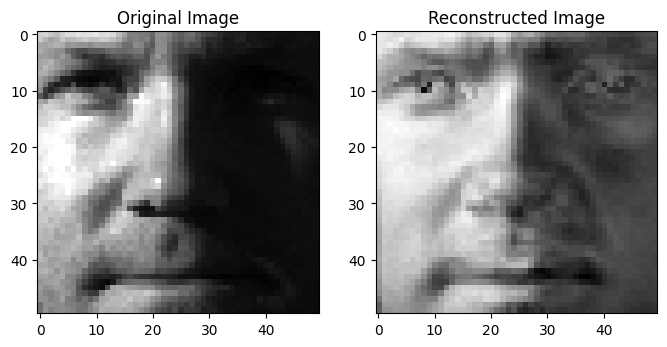

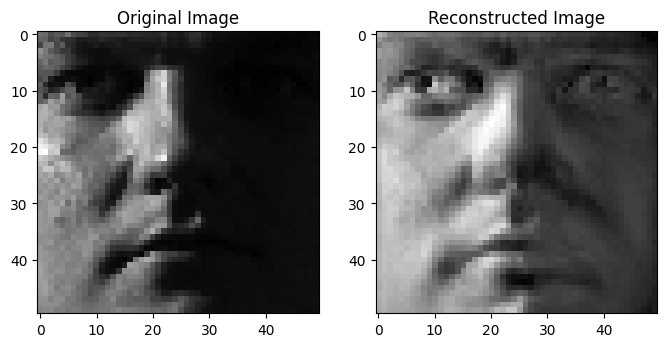

In [23]:
import matplotlib.pyplot as plt
import numpy as np

sets = ["Set_1", "Set_2", "Set_3", "Set_4", "Set_5"]
new_dim = 30
for set_name in sets:
  images, labels = loadImages(folder_path, set_name)
  X = np.array(images)

  # Επιλογή new_dim κορυφαίων ιδιοδιανυσμάτων
  principal_components = PCA_eig_decomp(X, new_dim)

  # Υπολογισμός νέων χαρακτηριστικών
  X_new = np.dot(X, principal_components)

  # Εκτέλεση της ανακατασκευής μίας τυχαίας εικόνας από το Set_1
  random_image_index = np.random.randint(0, len(images))
  regression_and_print_rand(X_new, principal_components, random_image_index)

Ζητούμενο 7:

Παρατηρώ ότι τα 9 δεξιά singular vectors οταν τα απεικονισουμε είναι πιό παρόμοια μεταξύ τους από ότι τα eigenvectors. Ισως αυτο ωφείλεται στο γεγονός ότι τα eigenvectors είναι ορθογώνια μεταξύ τους, άρα και ανεξάρτητα και έτσι περιμένουμε ίσως πολύ διαφορετικές απεικονίσεις από ότι στα eigenvectors. Τα eigenvectors άλλωστε περιγραφουν τις διαφορετικές κατευθύνσεις του πίνακα συνδιακύμανσης. Οπότε βγάζει και λογική αφου περιγράφουν διαφορετικές κατευθύνσεις να είναι και πολυ διαφορετικές οι απεικονίσεις. Τα δεξιά singular vectors από την άλλη περιγράφουν τα πιό σημαντικά χαρακτηριστικά των εικόνων. Οπότε αφού εστιάζουν στις κύριες διακυμάνσεις αναμένεται να είναι και πιο παρόμοια μεταξύ τους.

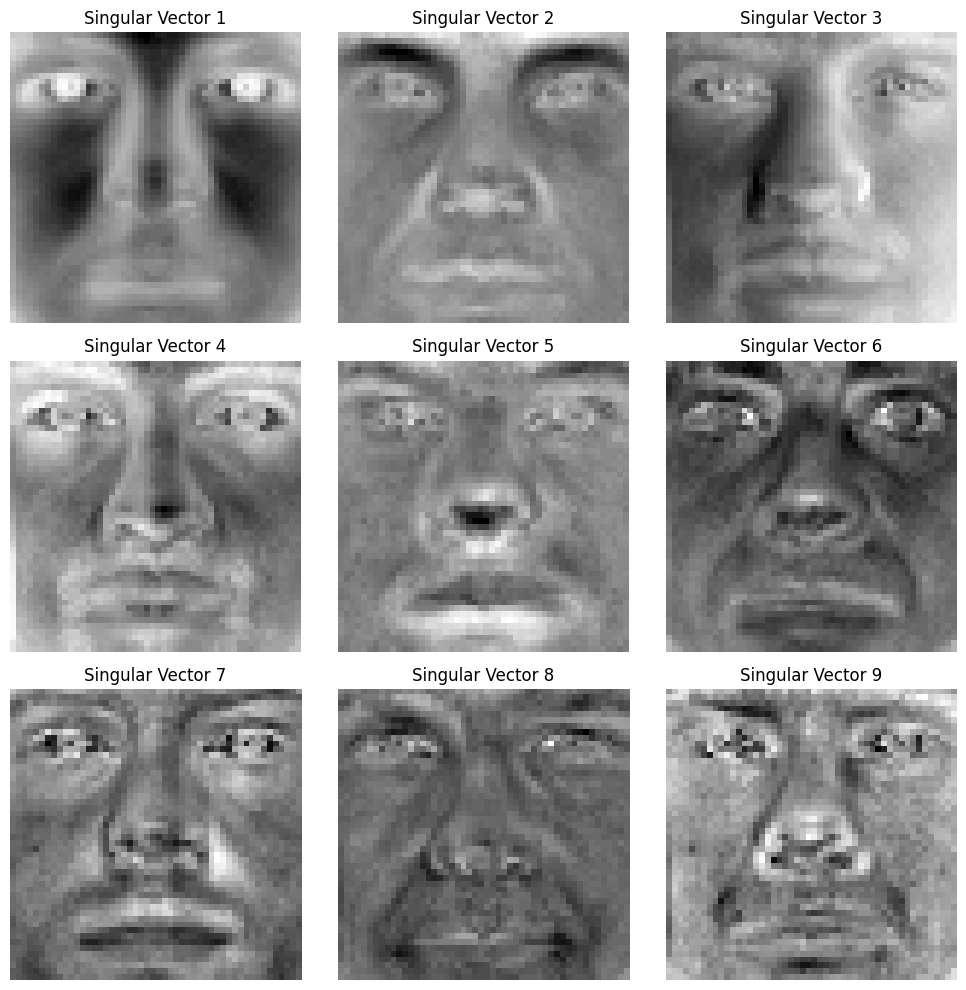

In [24]:
import numpy as np
import matplotlib.pyplot as plt

images, labels = loadImages(folder_path, "Set_1")
X = np.array(images)

# Εκτέλεση SVD
U, s, Vt = np.linalg.svd(X, full_matrices=False)

# Επιλογή των 9 κυρίων singular vectors
main_singular_vectors = Vt[:9, :]

# Απεικόνιση των 9 κυρίων singular vectors
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(main_singular_vectors[i].reshape(50, 50), cmap='gray')
    ax.set_title(f'Singular Vector {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()
